Take a copy of this notebook for each model you will implement.

This is the initial notebook — any changes will be made here before starting model building to ensure consistency across all notebooks.

**Key Consistency Tips**

* Standardized Headings: Use identical section names across all notebooks.

* Code Comments: Explain non-trivial steps (e.g., "Handling class imbalance with SMOTE").

* Version Control: Add a requirements.txt in the repo for dependency management. مش لازم

* Outputs: Save all plots/figures to a /results folder with consistent naming (e.g., XGBoost_SHAP.png).
اعتقد هتبقى كويسة عشان واحنا بنعمل البيبر ما نقعدش ناخد سكرينات


* Reproducibility: Set global random seeds (e.g., np.random.seed(42)).

# **Imports**

In [ ]:
%%capture
!pip install -q lime shap

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
import kagglehub
from sklearn.model_selection import train_test_split, learning_curve, ValidationCurveDisplay
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, RocCurveDisplay, auc, PrecisionRecallDisplay
from sklearn.inspection import PartialDependenceDisplay
import warnings
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings('ignore')

# **Utils**

In [ ]:
def our_confusion_matrix(model, name='Model'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, cmap="Oranges", ax=ax1)
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap="Oranges", ax=ax2)
    plt.title(f"{name} Confusion Matrix")

def our_roc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    roc1 = RocCurveDisplay.from_estimator(
    model, X_train, y_train,
    name=name, ax=ax1,
    color="orange" #juicy juicy
    )
    roc2 = RocCurveDisplay.from_estimator(
        model, X_test, y_test,
        name=name, ax=ax2,
        color="orange" #juicy juicy
    )
    ax1.fill_between(roc1.fpr, roc1.tpr, alpha=0.4, color="orange")
    ax2.fill_between(roc2.fpr, roc2.tpr, alpha=0.4, color="orange")
    ax1.set_title(f"{name} Training ROC Curve", fontsize=16)
    ax2.set_title(f"{name} Testing ROC Curve", fontsize=16)
    for ax in [ax1, ax2]:
        ax.grid(alpha=0.5)

def our_learning_curve(model, name='Model'):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, cv=5, scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10), random_state=0
    )

    plt.figure(figsize=(13, 8))
    plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="mediumseagreen", label="Training score")
    plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="royalblue", label="Cross-validation score")
    plt.title(f"{name} Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.grid(alpha=0.5)

def our_prc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 13))
    train_disp = PrecisionRecallDisplay.from_estimator(model, X_train, y_train, ax=ax1, color='orange')
    test_disp = PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=ax2, color='orange')
    ax1.set_title(f"{name} Precision-Recall Curve - Train")
    ax2.set_title(f"{name} Precision-Recall Curve - Test")
    ax1.fill_between(train_disp.recall, train_disp.precision, alpha=0.4, color='orange')
    ax2.fill_between(test_disp.recall, test_disp.precision, alpha=0.4, color='orange')

# **Load Processed Dat**a

In [ ]:
path = kagglehub.dataset_download('mohamedhassan77/xai-project-processed-data')
df = pd.read_csv(f"{path}/combined_adasyn_train_test.csv")
df

100%|██████████| 145k/145k [00:00<00:00, 22.7MB/s]

Extracting files...


,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,promotion_velocity,workload_score,compensation_ratio,Attrition,Set
0,31,2,1062,1,24,3,3,3,0,96,...,3,10.0,9,1,8,9.999900,1,1.019760,0,Train
1,50,2,328,1,1,3,3,3,1,86,...,2,3.0,2,0,2,300000.000000,2,1.281918,0,Train
2,46,2,717,1,13,4,1,3,1,34,...,3,10.0,7,0,9,1000000.000000,1,0.832635,0,Train
3,44,2,170,1,1,4,1,2,1,78,...,3,2.0,0,2,2,0.999995,1,0.753443,0,Train
4,26,1,1479,1,1,3,1,3,0,84,...,1,6.0,5,1,4,5.999940,3,1.007878,0,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,56,2,1162,1,24,2,1,1,1,97,...,3,4.0,2,1,0,3.999960,1,0.898732,1,Test
2043,46,2,669,2,9,2,3,3,1,64,...,3,9.0,8,4,7,2.249994,1,1.558490,1,Test
2044,30,2,1240,0,9,3,0,3,1,48,...,1,11.0,9,4,7,2.749993,7,2.052053,0,Test
2045,31,2,741,1,2,4,1,2,1,69,...,4,5.0,2,0,3,500000.000000,0,1.207921,0,Test


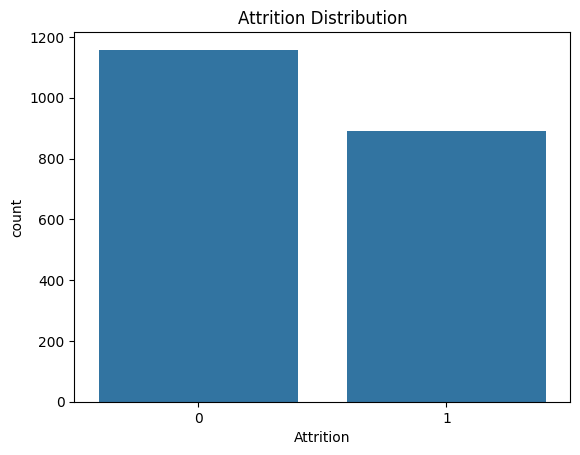

In [ ]:
sns.countplot(x='Attrition', data=df)
plt.title('Attrition Distribution')
plt.show()

In [ ]:
train_df = df[df['Set'] == 'Train'].drop(columns=['Set'])
test_df = df[df['Set'] == 'Test'].drop(columns=['Set'])

X_train = train_df.drop(columns=['Attrition'])
y_train = train_df['Attrition']

X_test = test_df.drop(columns=['Attrition'])
y_test = test_df['Attrition']

print("X_train:", X_train.shape, "y_train:", y_train.shape)
print("X_test:", X_test.shape, "y_test:", y_test.shape)

X_train: (1589, 33) y_train: (1589,)
X_test: (458, 33) y_test: (458,)


# **Model Initialization**

In [ ]:
rf = RandomForestClassifier().fit(X_train, y_train)
rf.score(X_train, y_train), rf.score(X_test, y_test)

(1.0, 0.8318777292576419)

# **Model Evaluation**

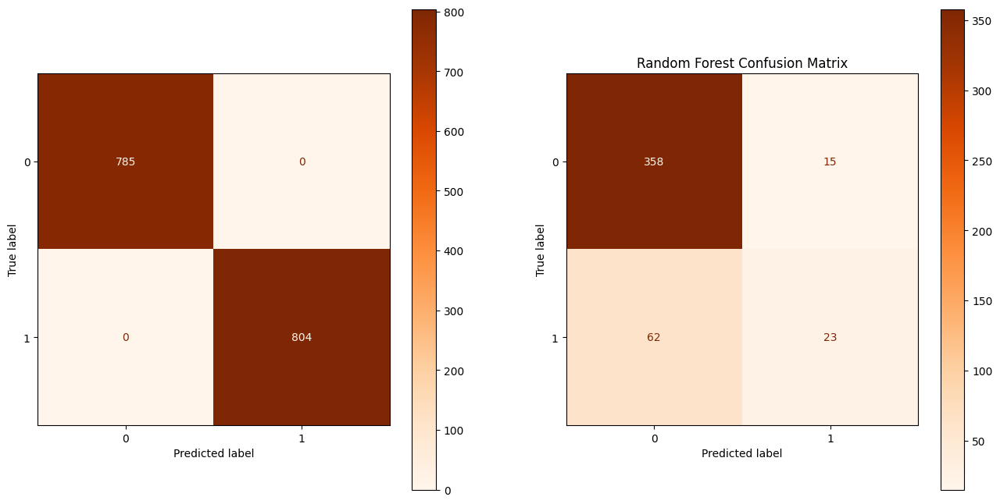

In [ ]:
our_confusion_matrix(rf, "Random Forest")

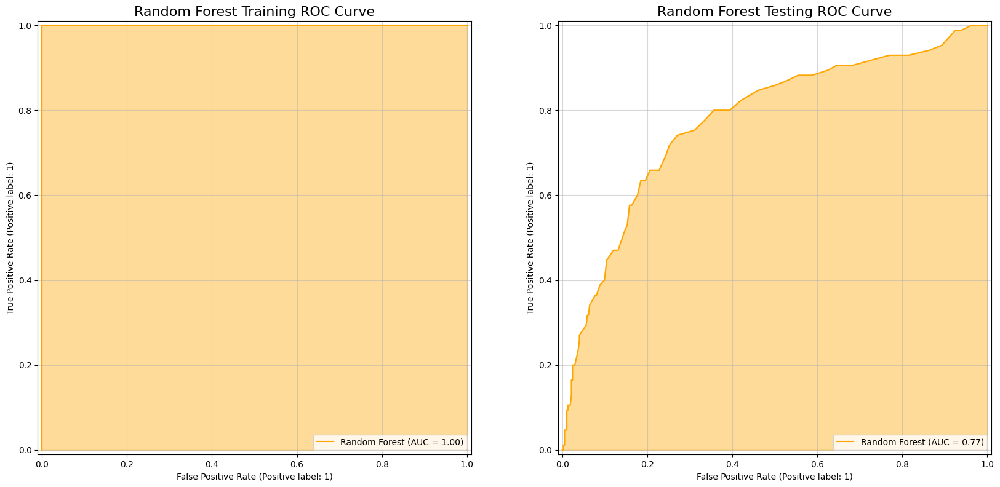

In [ ]:
our_roc(rf, "Random Forest")

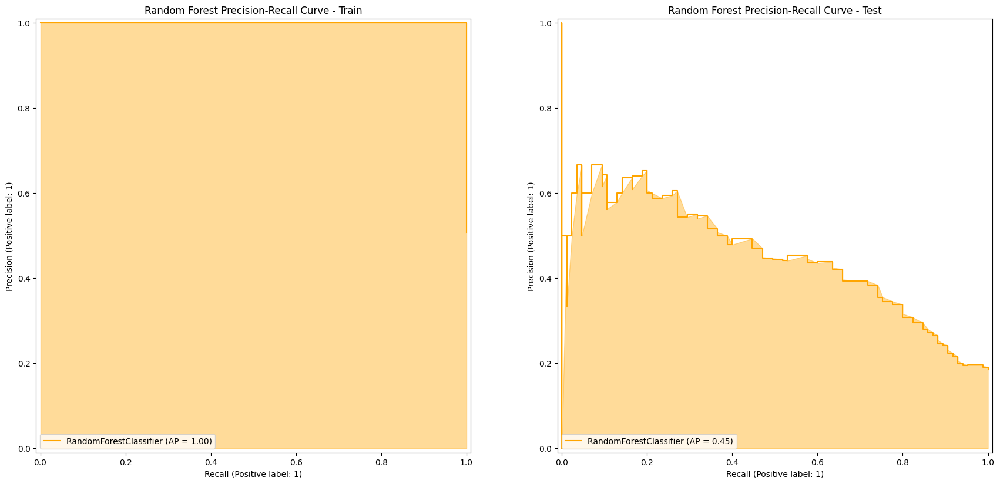

In [ ]:
our_prc(rf, "Random Forest")

# **Explainability Techniques**

## Partial Dependence Plots

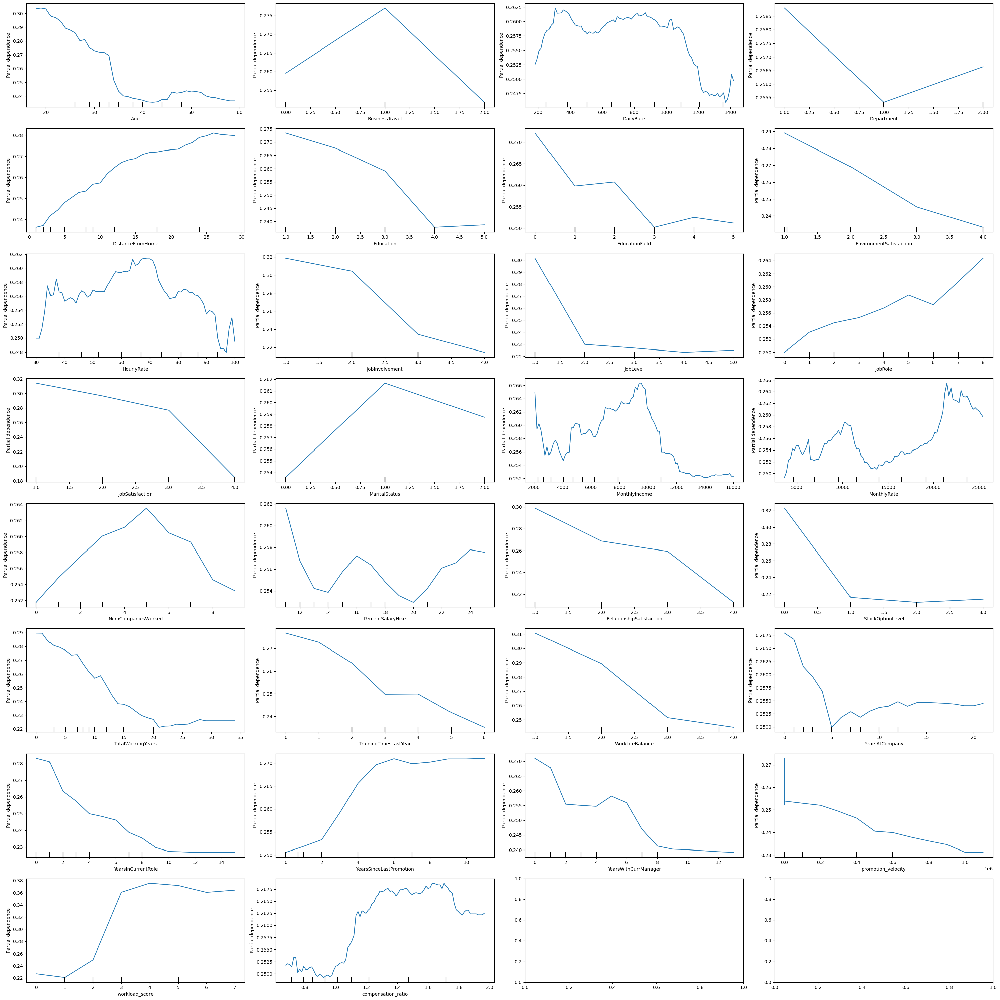

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(30, 30))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat], ax=ax)
plt.tight_layout()

2 way PDP

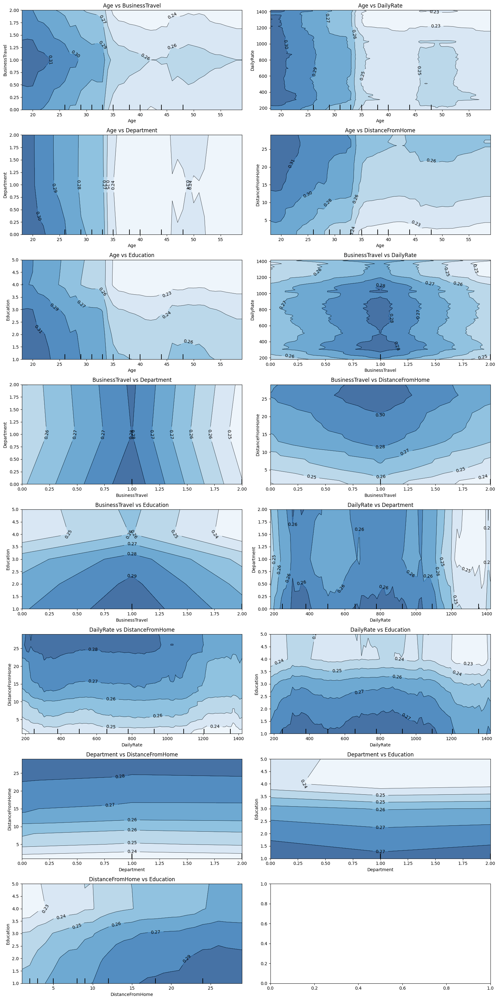

In [ ]:
important_features = cols[:6]
feature_pairs = []
for i in range(len(important_features)):
    for j in range(i+1, len(important_features)):
        feature_pairs.append((important_features[i], important_features[j]))

n_pairs = len(feature_pairs)
n_cols = 2
n_rows = (n_pairs + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))

for ax, feat_pair in zip(axes.flatten(), feature_pairs):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat_pair], ax=ax,
        kind='average', contour_kw={'cmap': 'Blues'})
    ax.set_title(f'{feat_pair[0]} vs {feat_pair[1]}')



plt.tight_layout()

## ICE

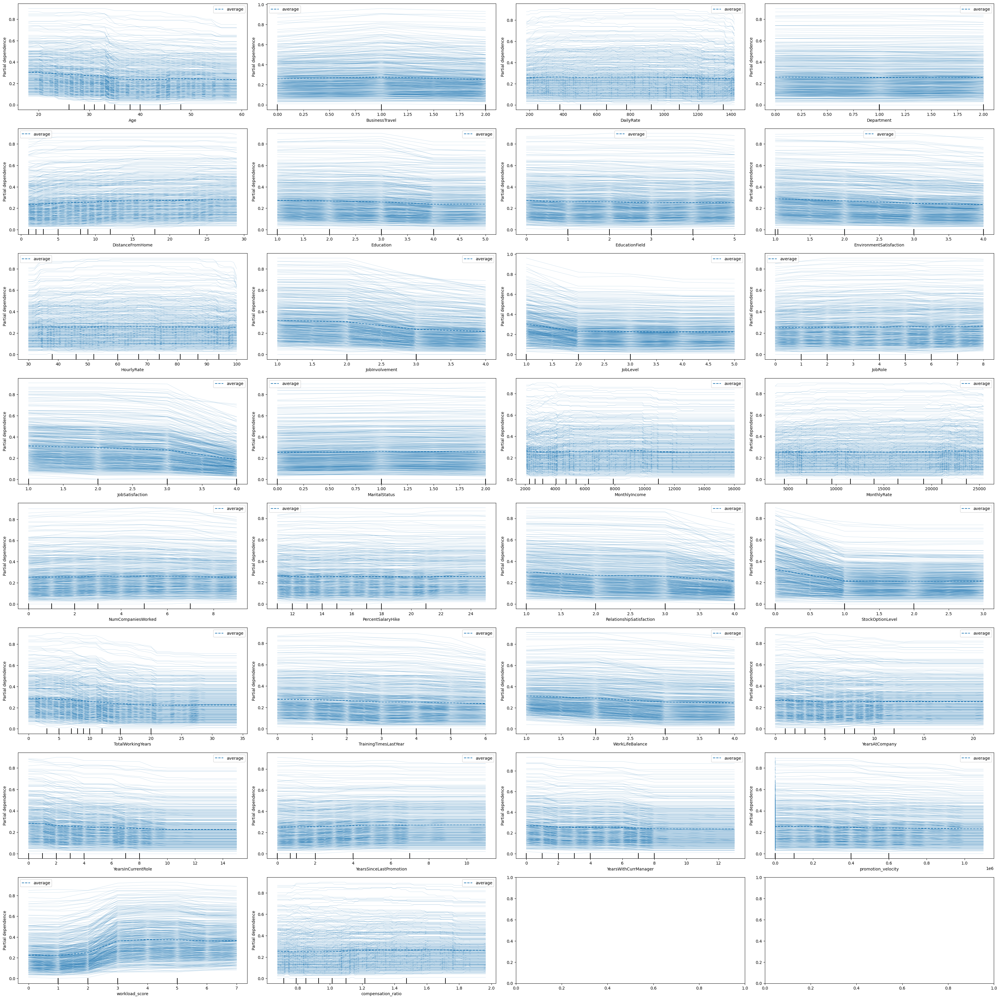

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(34, 34))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat], ax=ax, kind='both')
plt.tight_layout()

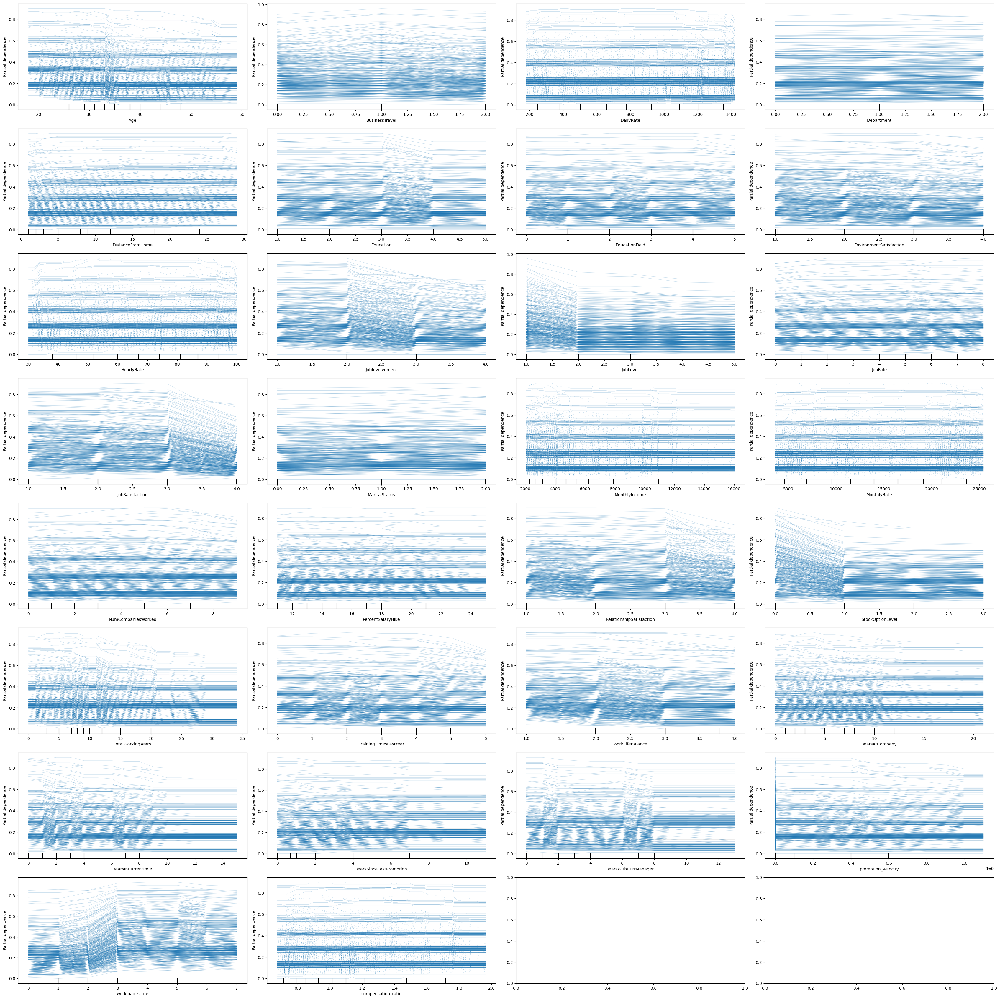

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(34, 34))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat], ax=ax, kind='individual')
plt.tight_layout()

## Feature Importance

[Text(3, 0, '0.005'),
 Text(3, 0, '0.006'),
 Text(3, 0, '0.008'),
 Text(3, 0, '0.010'),
 Text(3, 0, '0.012'),
 Text(3, 0, '0.014'),
 Text(3, 0, '0.015'),
 Text(3, 0, '0.017'),
 Text(3, 0, '0.018'),
 Text(3, 0, '0.018'),
 Text(3, 0, '0.019'),
 Text(3, 0, '0.020'),
 Text(3, 0, '0.021'),
 Text(3, 0, '0.022'),
 Text(3, 0, '0.022'),
 Text(3, 0, '0.025'),
 Text(3, 0, '0.026'),
 Text(3, 0, '0.027'),
 Text(3, 0, '0.030'),
 Text(3, 0, '0.030'),
 Text(3, 0, '0.030'),
 Text(3, 0, '0.031'),
 Text(3, 0, '0.033'),
 Text(3, 0, '0.039'),
 Text(3, 0, '0.040'),
 Text(3, 0, '0.042'),
 Text(3, 0, '0.046'),
 Text(3, 0, '0.046'),
 Text(3, 0, '0.046'),
 Text(3, 0, '0.051'),
 Text(3, 0, '0.072'),
 Text(3, 0, '0.076'),
 Text(3, 0, '0.081')]

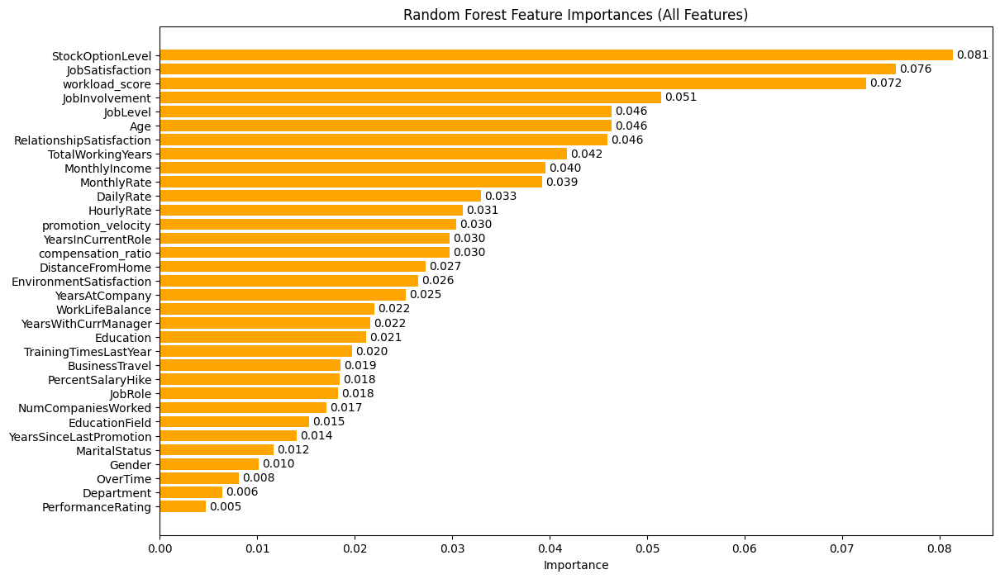

In [ ]:
importances = rf.feature_importances_
feat_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(13, 8))
ax = plt.gca()
bars = ax.barh(X_train.columns[feat_idx][::-1], importances[feat_idx][::-1], color="orange")
ax.set_xlabel("Importance")
ax.set_title("Random Forest Feature Importances (All Features)")
ax.bar_label(bars, fmt="%.3f", padding=3, fontsize=10)

## LIME Analysis

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
class_names = ['Attrition', 'No Attrition']
feature_names = list(X_train.columns)
explainer = LimeTabularExplainer(X_train.values, feature_names =
                                 feature_names,
                                 class_names = class_names,
                                 mode = 'classification')
exp = explainer.explain_instance(
    X_test.values[1],
    rf.predict_proba,
    num_features=len(feature_names)
)
exp.show_in_notebook(show_table=True)

## SHAP Analysis

<Figure size 640x480 with 0 Axes>

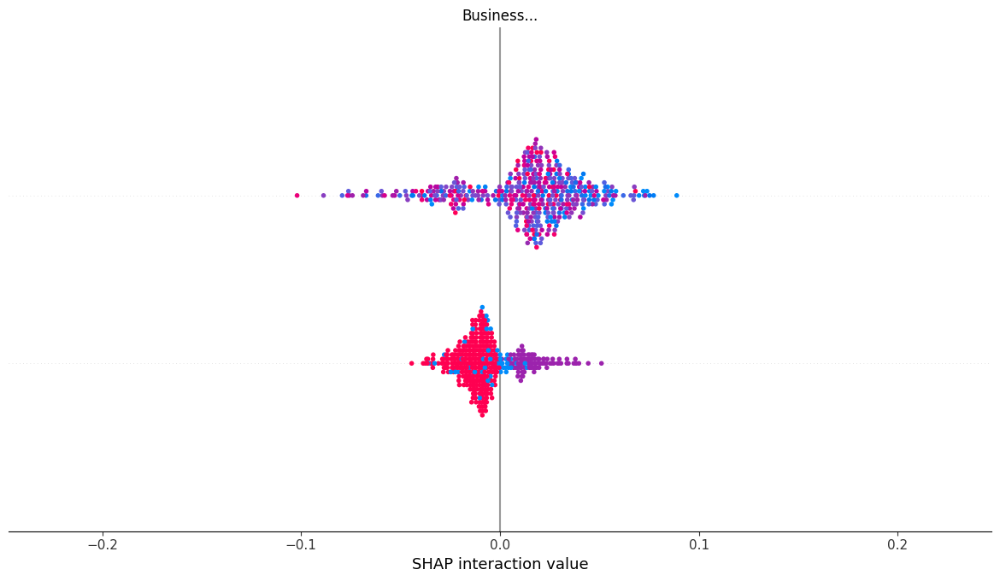

In [ ]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)